Train data 전처리 (Test도 동일하게 처리 예정)

In [42]:
import pandas as pd

# train - train.csv
df = pd.read_csv(r"dataview\data\train\train.csv", encoding = "utf-8")

In [ ]:
# 품종별 가격 분포 비교
df.groupby('품종명')['평년 평균가격(원)'].describe()

In [ ]:
print(df)

In [ ]:
# 상순 중순 하순 -> 숫자로 인코딩

# '상순', '중순', '하순'을 각각 '05', '15', '25'로 변환
df['시점'] = df['시점'].str.replace('상순', '05')
df['시점'] = df['시점'].str.replace('중순', '15')
df['시점'] = df['시점'].str.replace('하순', '25')

# 결과 확인
print(df)

In [ ]:
# 품목명과 품종명으로 그룹화하여 각 거래단위 추출
trade_units = df.groupby(['품목명', '품종명'])['거래단위'].unique()

# 결과 출력
for (품목, 품종), 단위 in trade_units.items():
    print(f'{품목} - {품종}, 거래단위: {단위[0]}')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.font_manager as fm

import matplotlib.font_manager as fm

# 1. 한글 폰트 설정 (예: 맑은 고딕)
plt.rc('font', family='Malgun Gothic')

# 2. 마이너스 폰트 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

# 색상 맵핑 (등급별로 다른 색상 지정)
grade_colors = {
    '특': 'red',
    '상': 'blue',
    '상품': 'green',
    '중품': 'purple',
    '중': 'orange',
    '하': 'brown'
}

# 시점을 날짜 형식으로 변환
df['시점'] = pd.to_datetime(df['시점'], format='%Y%m%d')

# 각 품목명-품종명 쌍에 대해 그래프 그리기
for (품목, 품종), group in df.groupby(['품목명', '품종명']):
    
    # 거래단위별로 그룹화하여 그래프를 별도로 그리기
    for 거래단위, trade_group in group.groupby('거래단위'):
        plt.figure(figsize=(35, 6))
        
        # 등급별로 다른 색상으로 데이터를 플로팅
        for grade, grade_group in trade_group.groupby('등급'):
            plt.plot(
                grade_group['시점'], 
                grade_group['평년 평균가격(원)'], 
                marker='o', 
                label=f'{품목}-{품종} ({grade})',
                color=grade_colors.get(grade, 'black')  # 등급에 맞는 색상 사용, 없으면 검정색
            )
        
        # 그래프 제목과 축 설정 (거래단위 추가)
        plt.title(f'[{품목} - {품종}] 평년 평균가격(원) ({거래단위}) (2018-2021)')
        plt.xlabel('시점')
        plt.ylabel('평년 평균가격(원)')
        
        # 시점에 맞게 X축 눈금을 설정 (중복 제거)
        unique_dates = trade_group['시점'].sort_values().unique()
        plt.xticks(unique_dates, rotation=45)
        
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        
        # 그래프 출력
        plt.show()

### 건고추

In [ ]:
# 시점을 날짜 형식으로 변환
df['시점'] = pd.to_datetime(df['시점'], format='%Y%m%d')

# '평년 평균가격(원)'을 숫자형으로 변환하고 0을 NaN으로 처리
df['평년 평균가격(원)'] = pd.to_numeric(df['평년 평균가격(원)'], errors='coerce')
df['평년 평균가격(원)'] = df['평년 평균가격(원)'].replace(0, np.nan)

print("결측치 처리 전:")
print(df['평년 평균가격(원)'].isnull().sum(), "개의 NaN 값")

# 비율 계산 (NaN 값 제외)
ratio_yanggeon = df[df['품종명'] == '햇살양건']['평년 평균가격(원)'].mean() / df[df['품종명'] == '양건']['평년 평균가격(원)'].mean()
ratio_hwagun = df[df['품종명'] == '햇살화건']['평년 평균가격(원)'].mean() / df[df['품종명'] == '화건']['평년 평균가격(원)'].mean()

# 결측치를 채우는 함수 수정
def fill_missing(row):
    if pd.isnull(row['평년 평균가격(원)']):
        if row['품종명'] == '햇살양건':
            yanggeon_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '양건')]['평년 평균가격(원)'].values
            if len(yanggeon_value) > 0 and not pd.isnull(yanggeon_value[0]):
                return yanggeon_value[0] * ratio_yanggeon
        elif row['품종명'] == '햇살화건':
            hwagun_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '화건')]['평년 평균가격(원)'].values
            if len(hwagun_value) > 0 and not pd.isnull(hwagun_value[0]):
                return hwagun_value[0] * ratio_hwagun
        elif row['품종명'] == '양건':
            sunyanggeon_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '햇살양건')]['평년 평균가격(원)'].values
            if len(sunyanggeon_value) > 0 and not pd.isnull(sunyanggeon_value[0]):
                return sunyanggeon_value[0] / ratio_yanggeon
        elif row['품종명'] == '화건':
            sunhwagun_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '햇살화건')]['평년 평균가격(원)'].values
            if len(sunhwagun_value) > 0 and not pd.isnull(sunhwagun_value[0]):
                return sunhwagun_value[0] / ratio_hwagun

        # 이전 및 이후 데이터 참조
        same_variety = df[df['품종명'] == row['품종명']].sort_values('시점')
        prev_value = same_variety[same_variety['시점'] < row['시점']]['평년 평균가격(원)'].last_valid_index()
        next_value = same_variety[same_variety['시점'] > row['시점']]['평년 평균가격(원)'].first_valid_index()
        
        if prev_value is not None and next_value is not None:
            return (df.loc[prev_value, '평년 평균가격(원)'] + df.loc[next_value, '평년 평균가격(원)']) / 2
        elif prev_value is not None:
            return df.loc[prev_value, '평년 평균가격(원)']
        elif next_value is not None:
            return df.loc[next_value, '평년 평균가격(원)']
    
    return row['평년 평균가격(원)']

# 결측치 채우기
df['평년 평균가격(원)'] = df.apply(fill_missing, axis=1)

print("\n결측치 처리 후:")
print(df['평년 평균가격(원)'].isnull().sum(), "개의 NaN 값")

# 변화 확인을 위한 시각화
def plot_price_trends(df, 품목, 품종):
    plt.figure(figsize=(15, 6))
    group = df[(df['품목명'] == 품목) & (df['품종명'] == 품종)]
    
    for 거래단위, trade_group in group.groupby('거래단위'):
        for grade, grade_group in trade_group.groupby('등급'):
            plt.plot(grade_group['시점'], grade_group['평년 평균가격(원)'], 
                     marker='o', label=f'{거래단위} ({grade})')
    
    plt.title(f'{품목} - {품종} 평년 평균가격 추이')
    plt.xlabel('시점')
    plt.ylabel('평년 평균가격(원)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 예시: '건고추'의 '양건'과 '햇살양건' 가격 추이 비교
plot_price_trends(df, '건고추', '양건')
plot_price_trends(df, '건고추', '햇살양건')

# 전체 데이터의 결측치 처리 전후 비교
plt.figure(figsize=(35, 6))
plt.scatter(df['시점'], df['평년 평균가격(원)'], alpha=0.5)
plt.title('전체 데이터의 평년 평균가격 분포')
plt.xlabel('시점')
plt.ylabel('평년 평균가격(원)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 처리된 결과 저장
# df.to_csv('processed_data.csv', index=False)

In [ ]:
# 시각화 설정
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

grade_colors = {
    '특': 'red',
    '상': 'blue',
    '상품': 'green',
    '중품': 'purple',
    '중': 'orange',
    '하': 'brown'
}

# 각 품목명-품종명 쌍에 대해 그래프 그리기
for (품목, 품종), group in df.groupby(['품목명', '품종명']):
    for 거래단위, trade_group in group.groupby('거래단위'):
        plt.figure(figsize=(35, 6))
        
        for grade, grade_group in trade_group.groupby('등급'):
            plt.plot(
                grade_group['시점'], 
                grade_group['평년 평균가격(원)'], 
                marker='o', 
                label=f'{품목}-{품종} ({grade})',
                color=grade_colors.get(grade, 'black')
            )
        
        plt.title(f'[{품목} - {품종}] 평년 평균가격(원) ({거래단위}) (2018-2021)')
        plt.xlabel('시점')
        plt.ylabel('평년 평균가격(원)')
        
        unique_dates = trade_group['시점'].sort_values().unique()
        plt.xticks(unique_dates, rotation=45)
        
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        
        plt.show()

# 각 품종별 평균 가격 출력
print("\n각 품종별 평균 가격:")
print(df.groupby('품종명')['평년 평균가격(원)'].mean())

데이터 형태: (29376, 7)

'시점' 열의 데이터 타입: object

'시점' 열의 고유값 (처음 5개): ['201801상순' '201801중순' '201801하순' '201802상순' '201802중순']

'시점' 열의 데이터 예시 (처음 5개):
0    201801상순
1    201801중순
2    201801하순
3    201802상순
4    201802중순
Name: 시점, dtype: object

데이터 처리 후 '시점' 열의 데이터 타입: datetime64[ns]

처리 후 '시점' 열의 데이터 예시 (처음 5개):
0   2018-01-05
1   2018-01-15
2   2018-01-25
3   2018-02-05
4   2018-02-15
Name: 시점, dtype: datetime64[ns]

결측치 처리 전:
21860 개의 NaN 값

결측치 처리 후:
984 개의 NaN 값


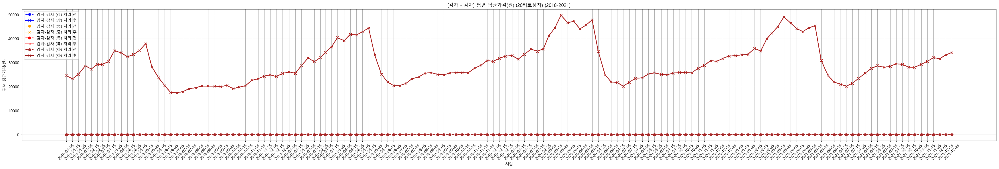

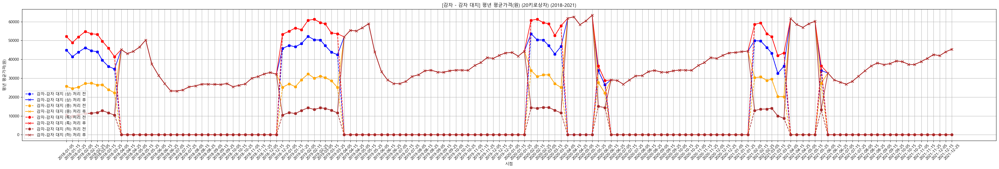

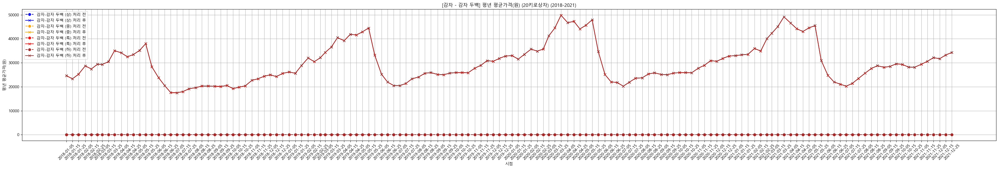

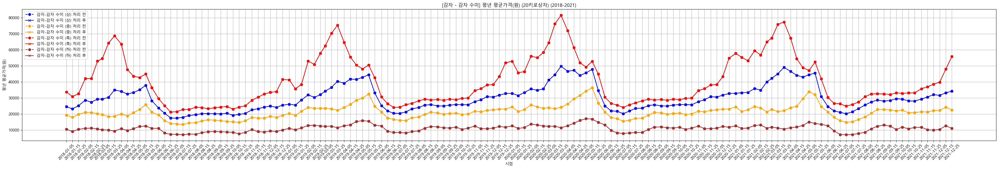

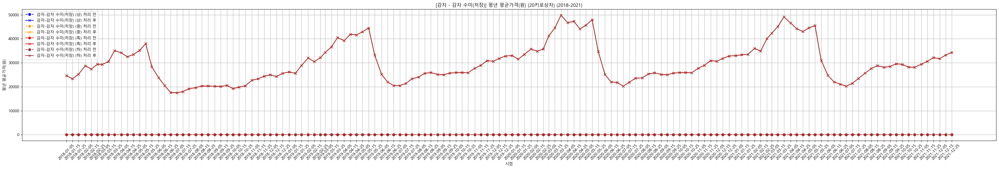

...

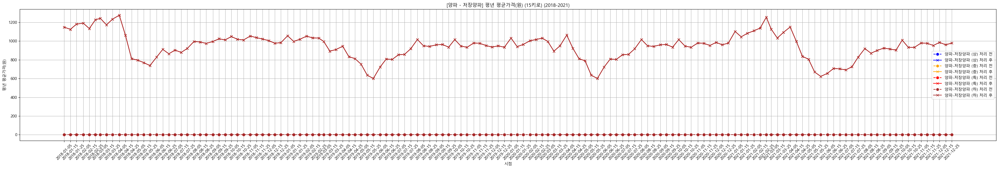

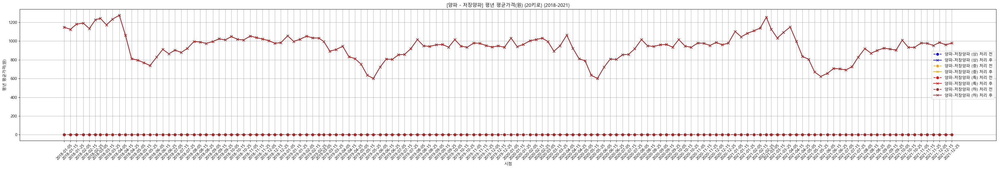

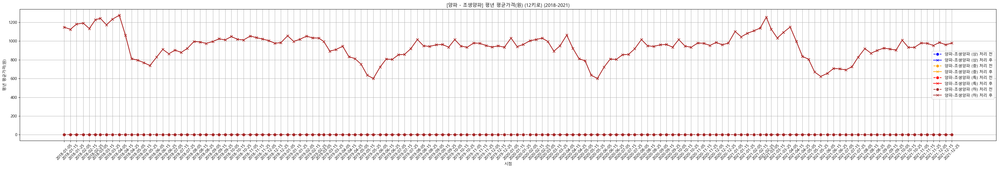

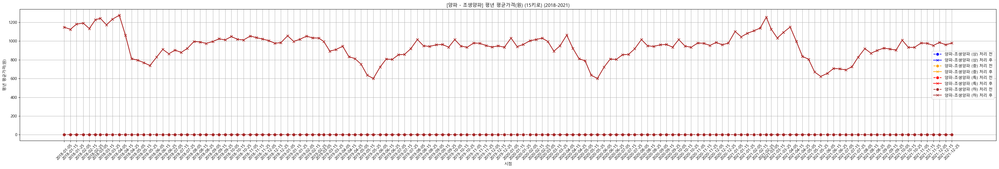

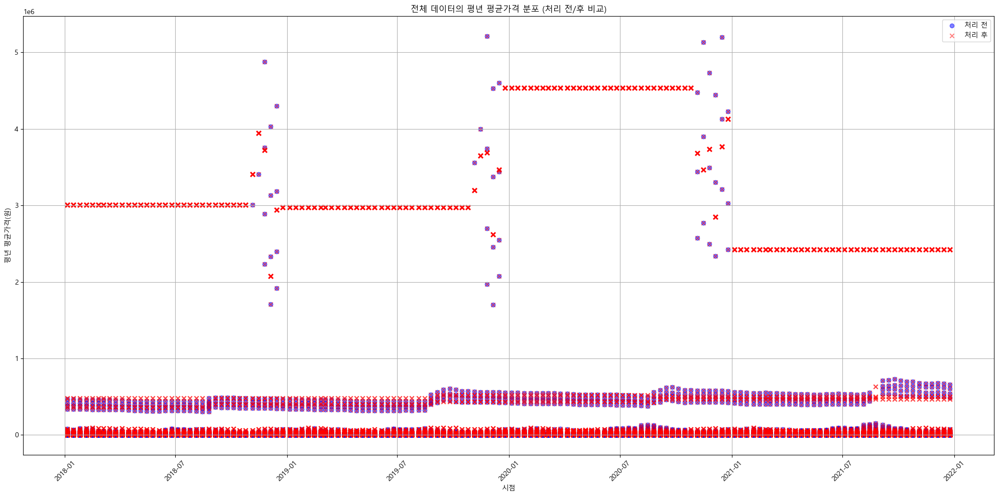

In [51]:
# !!!!
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 데이터 로드 (파일 경로를 적절히 수정해주세요)
df = pd.read_csv(r"dataview\data\train\train.csv", encoding="utf-8")


# 원본 데이터 복사
df_original = df.copy()

# 데이터 상태 확인
print("데이터 형태:", df.shape)
print("\n'시점' 열의 데이터 타입:", df['시점'].dtype)
print("\n'시점' 열의 고유값 (처음 5개):", df['시점'].unique()[:5])
print("\n'시점' 열의 데이터 예시 (처음 5개):")
print(df['시점'].head())

# '시점' 열 처리
def process_date(date_str):
    if pd.isna(date_str):
        return pd.NaT
    if isinstance(date_str, str):
        date_str = date_str.replace('상순', '05').replace('중순', '15').replace('하순', '25')
        return pd.to_datetime(date_str, format='%Y%m%d', errors='coerce')
    return pd.to_datetime(date_str, errors='coerce')

df['시점'] = df['시점'].apply(process_date)
df_original['시점'] = df_original['시점'].apply(process_date)

# '평년 평균가격(원)'을 숫자형으로 변환하고 0을 NaN으로 처리
df['평년 평균가격(원)'] = pd.to_numeric(df['평년 평균가격(원)'], errors='coerce')
df['평년 평균가격(원)'] = df['평년 평균가격(원)'].replace(0, np.nan)

print("\n데이터 처리 후 '시점' 열의 데이터 타입:", df['시점'].dtype)
print("\n처리 후 '시점' 열의 데이터 예시 (처음 5개):")
print(df['시점'].head())

print("\n결측치 처리 전:")
print(df['평년 평균가격(원)'].isnull().sum(), "개의 NaN 값")

# 품목별 품종 그룹 정의
crop_varieties = {
    '배추': ['배추', '쌈배추', '알배기배추', '얼갈이배추', '봄동배추', '절임배추'],
    '무': ['무', '다발무', '열무'],
    '양파': ['양파', '저장양파', '조생양파', '양파(햇)', '자주양파', '양파수입'],
    '사과': ['홍로', '후지', '쓰가루'],
    '배': ['신고', '원황'],
    '건고추': ['화건', '햇산양건', '양건'],
    '깐마늘': ['깐마늘(국산)'],
    '감자': ['감자 수미', '감자 수미(햇)', '감자', '감자 조풍', '감자 대지', '감자 두백', '감자 수미(저장)', '홍감자', '감자 수입'],
    '대파': ['대파(일반)', '실파', '깐쪽파', '쪽파', '대파수입'],
    '상추': ['청', '적']
}

# 건고추에 대한 특별 처리
ratio_yanggeon = df[df['품종명'] == '햇살양건']['평년 평균가격(원)'].mean() / df[df['품종명'] == '양건']['평년 평균가격(원)'].mean()
ratio_hwagun = df[df['품종명'] == '햇살화건']['평년 평균가격(원)'].mean() / df[df['품종명'] == '화건']['평년 평균가격(원)'].mean()

def fill_missing_chili(row):
    if pd.isnull(row['평년 평균가격(원)']):
        if row['품종명'] == '햇살양건':
            yanggeon_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '양건')]['평년 평균가격(원)'].values
            if len(yanggeon_value) > 0 and not pd.isnull(yanggeon_value[0]):
                return yanggeon_value[0] * ratio_yanggeon
        elif row['품종명'] == '햇살화건':
            hwagun_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '화건')]['평년 평균가격(원)'].values
            if len(hwagun_value) > 0 and not pd.isnull(hwagun_value[0]):
                return hwagun_value[0] * ratio_hwagun
        elif row['품종명'] == '양건':
            sunyanggeon_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '햇살양건')]['평년 평균가격(원)'].values
            if len(sunyanggeon_value) > 0 and not pd.isnull(sunyanggeon_value[0]):
                return sunyanggeon_value[0] / ratio_yanggeon
        elif row['품종명'] == '화건':
            sunhwagun_value = df[(df['시점'] == row['시점']) & (df['품종명'] == '햇살화건')]['평년 평균가격(원)'].values
            if len(sunhwagun_value) > 0 and not pd.isnull(sunhwagun_value[0]):
                return sunhwagun_value[0] / ratio_hwagun

        # 이전 및 이후 데이터 참조
        same_variety = df[df['품종명'] == row['품종명']].sort_values('시점')
        prev_value = same_variety[same_variety['시점'] < row['시점']]['평년 평균가격(원)'].last_valid_index()
        next_value = same_variety[same_variety['시점'] > row['시점']]['평년 평균가격(원)'].first_valid_index()
        
        if prev_value is not None and next_value is not None:
            return (df.loc[prev_value, '평년 평균가격(원)'] + df.loc[next_value, '평년 평균가격(원)']) / 2
        elif prev_value is not None:
            return df.loc[prev_value, '평년 평균가격(원)']
        elif next_value is not None:
            return df.loc[next_value, '평년 평균가격(원)']
    
    return row['평년 평균가격(원)']

# 다른 작물에 대한 일반적인 결측치 처리 함수
def calculate_ratios(df, crop, varieties):
    ratios = {}
    base_variety = varieties[0]
    base_mean = df[df['품종명'] == base_variety]['평년 평균가격(원)'].mean()
    
    for variety in varieties[1:]:
        variety_mean = df[df['품종명'] == variety]['평년 평균가격(원)'].mean()
        if base_mean != 0 and not np.isnan(base_mean) and not np.isnan(variety_mean):
            ratios[variety] = variety_mean / base_mean
    
    return ratios, base_variety

def fill_missing_by_crop(row, crop, varieties, ratios, base_variety):
    if pd.isnull(row['평년 평균가격(원)']) and row['품종명'] in varieties:
        if row['품종명'] == base_variety:
            other_varieties = [v for v in varieties if v != base_variety]
            for other in other_varieties:
                other_value = df[(df['시점'] == row['시점']) & (df['품종명'] == other)]['평년 평균가격(원)'].values
                if len(other_value) > 0 and not pd.isnull(other_value[0]):
                    return other_value[0] / ratios.get(other, 1)
        else:
            base_value = df[(df['시점'] == row['시점']) & (df['품종명'] == base_variety)]['평년 평균가격(원)'].values
            if len(base_value) > 0 and not pd.isnull(base_value[0]):
                return base_value[0] * ratios.get(row['품종명'], 1)

        # 이전 및 이후 데이터 참조
        same_variety = df[(df['품종명'] == row['품종명']) & (df['품목명'] == crop)].sort_values('시점')
        prev_value = same_variety[same_variety['시점'] < row['시점']]['평년 평균가격(원)'].last_valid_index()
        next_value = same_variety[same_variety['시점'] > row['시점']]['평년 평균가격(원)'].first_valid_index()
        
        if prev_value is not None and next_value is not None:
            return (df.loc[prev_value, '평년 평균가격(원)'] + df.loc[next_value, '평년 평균가격(원)']) / 2
        elif prev_value is not None:
            return df.loc[prev_value, '평년 평균가격(원)']
        elif next_value is not None:
            return df.loc[next_value, '평년 평균가격(원)']

    return row['평년 평균가격(원)']

# 각 작물에 대해 결측치 처리 적용
for crop, varieties in crop_varieties.items():
    if crop == '건고추':
        df.loc[df['품목명'] == crop, '평년 평균가격(원)'] = df[df['품목명'] == crop].apply(fill_missing_chili, axis=1)
    else:
        ratios, base_variety = calculate_ratios(df, crop, varieties)
        df.loc[df['품목명'] == crop, '평년 평균가격(원)'] = df[df['품목명'] == crop].apply(
            lambda row: fill_missing_by_crop(row, crop, varieties, ratios, base_variety), axis=1
        )

print("\n결측치 처리 후:")
print(df['평년 평균가격(원)'].isnull().sum(), "개의 NaN 값")

# 색상 맵핑 (등급별로 다른 색상 지정)
grade_colors = {
    '특': 'red',
    '상': 'blue',
    '상품': 'green',
    '중품': 'purple',
    '중': 'orange',
    '하': 'brown'
}

# 변화 확인을 위한 시각화 함수
def plot_price_trends_comparison(df_original, df_processed):
    for (품목, 품종), group in df_processed.groupby(['품목명', '품종명']):
        for 거래단위, trade_group in group.groupby('거래단위'):
            plt.figure(figsize=(35, 6))
            
            for grade, grade_group in trade_group.groupby('등급'):
                original_group = df_original[(df_original['품목명'] == 품목) & 
                                             (df_original['품종명'] == 품종) & 
                                             (df_original['거래단위'] == 거래단위) & 
                                             (df_original['등급'] == grade)]
                
                plt.plot(original_group['시점'], original_group['평년 평균가격(원)'], 
                         marker='o', linestyle='--', 
                         label=f'{품목}-{품종} ({grade}) 처리 전', 
                         color=grade_colors.get(grade, 'black'))
                
                plt.plot(grade_group['시점'], grade_group['평년 평균가격(원)'], 
                         marker='x', linestyle='-', 
                         label=f'{품목}-{품종} ({grade}) 처리 후', 
                         color=grade_colors.get(grade, 'black'))
            
            plt.title(f'[{품목} - {품종}] 평년 평균가격(원) ({거래단위}) (2018-2021)')
            plt.xlabel('시점')
            plt.ylabel('평년 평균가격(원)')
            
            unique_dates = trade_group['시점'].sort_values().unique()
            plt.xticks(unique_dates, rotation=45)
            
            plt.grid(True)
            plt.legend()
            plt.tight_layout()
            plt.show()

# 그래프 생성
plot_price_trends_comparison(df_original, df)

# 전체 데이터의 결측치 처리 전후 비교
plt.figure(figsize=(20, 10))
plt.scatter(df_original['시점'], df_original['평년 평균가격(원)'], 
            alpha=0.5, label='처리 전', color='blue', marker='o')
plt.scatter(df['시점'], df['평년 평균가격(원)'], 
            alpha=0.5, label='처리 후', color='red', marker='x')
plt.title('전체 데이터의 평년 평균가격 분포 (처리 전/후 비교)')
plt.xlabel('시점')
plt.ylabel('평년 평균가격(원)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 처리된 결과 저장
df.to_csv('processed_data_all_crops_comparison.csv', index=False)


결측치 처리 전:
총 결측치 개수: 0

품목명별 결측치 개수:
Series([], Name: count, dtype: int64)

품종명별 결측치 개수:
Series([], Name: count, dtype: int64)

거래단위별 결측치 개수:
Series([], Name: count, dtype: int64)

등급별 결측치 개수:
Series([], Name: count, dtype: int64)

연도별 결측치 개수:
Series([], Name: count, dtype: int64)

월별 결측치 개수:
Series([], Name: count, dtype: int64)

결측치가 있는 행 (처음 10개):
Empty DataFrame
Columns: [시점, 품목명, 품종명, 거래단위, 등급, 평년 평균가격(원), 평균가격(원), 연도, 월]
Index: []


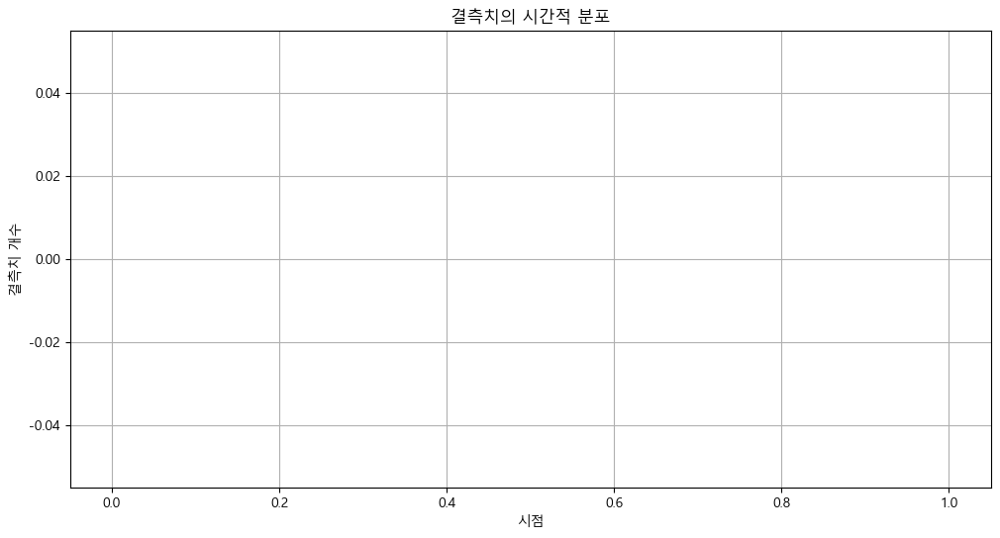


결측치 처리 후:
총 결측치 개수: 984

품목명별 결측치 개수:
품목명
양파         552
깐마늘(국산)    288
대파         144
Name: count, dtype: int64

품종명별 결측치 개수:
품종명
양파 수입      552
깐마늘(국산)    288
대파 수입      144
Name: count, dtype: int64

거래단위별 결측치 개수:
거래단위
1키로       552
20 kg     288
10키로상자    144
Name: count, dtype: int64

등급별 결측치 개수:
등급
상     280
상품    144
중품    144
특     144
중     136
하     136
Name: count, dtype: int64

연도별 결측치 개수:
연도
2018    252
2019    252
2020    252
2021    228
Name: count, dtype: int64

월별 결측치 개수:
월
1     84
2     81
3     75
4     75
5     81
6     84
7     84
8     84
9     84
10    84
11    84
12    84
Name: count, dtype: int64

결측치가 있는 행 (처음 10개):
             시점      품목명      품종명   거래단위  등급  평년 평균가격(원)        평균가격(원)    연도  \
7200 2018-01-05  깐마늘(국산)  깐마늘(국산)  20 kg  상품         NaN  130666.666667  2018   
7201 2018-01-15  깐마늘(국산)  깐마늘(국산)  20 kg  상품         NaN  130600.000000  2018   
7202 2018-01-25  깐마늘(국산)  깐마늘(국산)  20 kg  상품         NaN  130600.000000  2018   
7203 2018-02-05  깐마늘(국산)

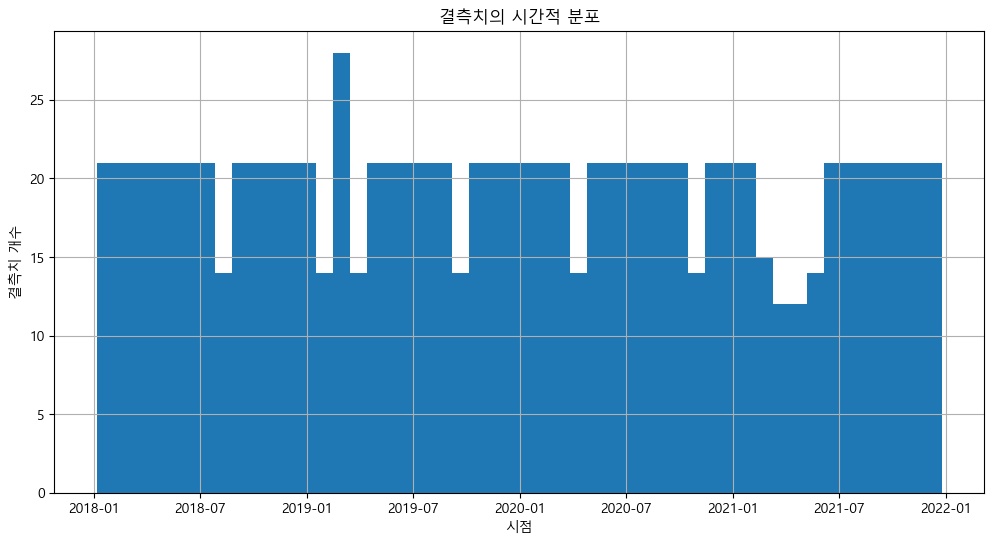


새로 생긴 결측치:
              시점      품목명      품종명    거래단위  등급  평년 평균가격(원)        평균가격(원)  \
7200  2018-01-05  깐마늘(국산)  깐마늘(국산)   20 kg  상품         NaN  130666.666667   
7201  2018-01-15  깐마늘(국산)  깐마늘(국산)   20 kg  상품         NaN  130600.000000   
7202  2018-01-25  깐마늘(국산)  깐마늘(국산)   20 kg  상품         NaN  130600.000000   
7203  2018-02-05  깐마늘(국산)  깐마늘(국산)   20 kg  상품         NaN  134614.500000   
7204  2018-02-15  깐마늘(국산)  깐마늘(국산)   20 kg  상품         NaN  137100.000000   
...          ...      ...      ...     ...  ..         ...            ...   
29227 2021-11-15       대파    대파 수입  10키로상자   상         NaN       0.000000   
29228 2021-11-25       대파    대파 수입  10키로상자   상         NaN       0.000000   
29229 2021-12-05       대파    대파 수입  10키로상자   상         NaN       0.000000   
29230 2021-12-15       대파    대파 수입  10키로상자   상         NaN       0.000000   
29231 2021-12-25       대파    대파 수입  10키로상자   상         NaN       0.000000   

         연도   월  
7200   2018   1  
7201   2018   1  
7202   20

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 결측치 분석 함수
def analyze_missing_values(df):
    print("총 결측치 개수:", df['평년 평균가격(원)'].isnull().sum())
    
    # 품목명별 결측치 개수
    print("\n품목명별 결측치 개수:")
    print(df[df['평년 평균가격(원)'].isnull()]['품목명'].value_counts())
    
    # 품종명별 결측치 개수
    print("\n품종명별 결측치 개수:")
    print(df[df['평년 평균가격(원)'].isnull()]['품종명'].value_counts())
    
    # 거래단위별 결측치 개수
    print("\n거래단위별 결측치 개수:")
    print(df[df['평년 평균가격(원)'].isnull()]['거래단위'].value_counts())
    
    # 등급별 결측치 개수
    print("\n등급별 결측치 개수:")
    print(df[df['평년 평균가격(원)'].isnull()]['등급'].value_counts())
    
    # 연도별 결측치 개수
    df['연도'] = df['시점'].dt.year
    print("\n연도별 결측치 개수:")
    print(df[df['평년 평균가격(원)'].isnull()]['연도'].value_counts().sort_index())
    
    # 월별 결측치 개수
    df['월'] = df['시점'].dt.month
    print("\n월별 결측치 개수:")
    print(df[df['평년 평균가격(원)'].isnull()]['월'].value_counts().sort_index())
    
    # 결측치가 있는 행 출력
    print("\n결측치가 있는 행 (처음 10개):")
    print(df[df['평년 평균가격(원)'].isnull()].head(10))
    
    # 결측치 분포 시각화
    plt.figure(figsize=(12, 6))
    df[df['평년 평균가격(원)'].isnull()]['시점'].hist(bins=50)
    plt.title('결측치의 시간적 분포')
    plt.xlabel('시점')
    plt.ylabel('결측치 개수')
    plt.show()

# 결측치 분석 실행
print("결측치 처리 전:")
analyze_missing_values(df_original)

print("\n결측치 처리 후:")
analyze_missing_values(df)

# 결측치가 새로 생긴 경우 확인
new_missing = df[df['평년 평균가격(원)'].isnull() & df_original['평년 평균가격(원)'].notnull()]
if not new_missing.empty:
    print("\n새로 생긴 결측치:")
    print(new_missing)

# 결측치가 채워진 경우 확인
filled_missing = df[df['평년 평균가격(원)'].notnull() & df_original['평년 평균가격(원)'].isnull()]
if not filled_missing.empty:
    print("\n채워진 결측치 개수:", len(filled_missing))
    print("\n채워진 결측치의 예 (처음 10개):")
    print(filled_missing.head(10))

In [ ]:
# 계절별, 명절(김장철) 고려해서 채우기기

### 평균가격(원)

In [ ]:
# 품종별 가격 분포 비교
df.groupby('품종명')['평균가격(원)'].describe()

In [ ]:
# 결측치 처리를 위한 전처리
# 각 품목명-품종명마다 시기별로 어느정도 비슷한지 확인해보고 싶었음 (품종명에 대해 검색해봐도 정확하게 나오는게 없는 경우)
# -> 결측치를 처리를 시기에 상관받지 않은 품종별 유사도를 통해 하기로 했기 때문에
# 하지만 인터넷에 검색해보았을때 데이터에 기재되어있는 품종명과 실제로 사용하는데 쓰는 품종명의 기준이 다르다고 생각했고, 명확하게 나와있지 않아 데이터 수치로 다시 한번 확인을 해봐야겠다고 생각함
# 또, 앞서 말한것처럼 품종명에서 완전하게 결측치를 제거할 수 없다고 생각해서 시기데이터를 이용하는게 좀 더 나을 것 같다고 생각함. 

# 원래는 결측치 값이 많냐 적냐 (10~20% 기준) 으로 하려했으나 결측치 비율이 품목-품종별로 다양해서 
# 결측치 비율로 어떤건 중앙값 대체하고 어떤 시점반영 중앙값,, 이러한 적용기준이 논리적이지 않고 애매하다고 생각함 

# 농산물의 수확 시기 (-> 공급 증가)
# 명절, 김장철 (-> 수요 증가)
# 농산물이 저장에 용이한지 (가격 변동성 유무)
# 해년별 농산물의 풍년, 평년, 흉년 

# 계절별로 나눠서 뽑은 후 김장철 같은 이벤트가 얼마나 영향을 미치는지 확인해보고 싶었음.
# 또 해년별 품목-품종 마다 풍년, 평년, 흉년을 알고 싶었음 -> 결측치 처리때 좀 더 세밀하게 할 수 있기 때문 

import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.font_manager as fm

# 1. 한글 폰트 설정 (예: 맑은 고딕)
plt.rc('font', family='Malgun Gothic')

# 2. 마이너스 폰트 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

# 색상 맵핑 (등급별로 다른 색상 지정)
grade_colors = {
    '특': 'red',
    '상': 'blue',
    '상품': 'green',
    '중품': 'purple',
    '중': 'orange',
    '하': 'brown'
}

# 시점을 날짜 형식으로 변환
df['시점'] = pd.to_datetime(df['시점'], format='%Y%m%d')

# 각 품목명-품종명 쌍에 대해 그래프 그리기
for (품목, 품종), group in df.groupby(['품목명', '품종명']):
    
    # 거래단위별로 그룹화하여 그래프를 별도로 그리기
    for 거래단위, trade_group in group.groupby('거래단위'):
        plt.figure(figsize=(35, 6))
        
        # 등급별로 다른 색상으로 데이터를 플로팅
        for grade, grade_group in trade_group.groupby('등급'):
            plt.plot(
                grade_group['시점'], 
                grade_group['평균가격(원)'], 
                marker='o', 
                label=f'{품목}-{품종} ({grade})',
                color=grade_colors.get(grade, 'black')  # 등급에 맞는 색상 사용, 없으면 검정색
            )
        
        # 그래프 제목과 축 설정 (거래단위 추가)
        plt.title(f'[{품목} - {품종}] 평균가격(원) ({거래단위}) (2018-2021)')
        plt.xlabel('시점')
        plt.ylabel('평균가격(원)')
        
        # 시점에 맞게 X축 눈금을 설정 (중복 제거)
        unique_dates = trade_group['시점'].sort_values().unique()
        plt.xticks(unique_dates, rotation=45)
        
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        
        # 그래프 출력
        plt.show()